In [389]:
import pandas as pd
import numpy as np
import random
import seaborn as sns
from sklearn.manifold import TSNE

from sklearn.preprocessing import StandardScaler

In [395]:
train_df = pd.read_csv('Combined Data/train_df_more.csv').drop_duplicates()

In [396]:
train_df.head(5)

,pothole_id,mm_to_pixel_ratio,pothole_length_mm,pothole_width_mm,pothole_area_mm2,pothole_aspect_ratio,pothole_perimeter_mm,pothole_compactness,bags_used
0,p1036,2.024225,485.814034,368.408976,1.143629e+05,1.318681,1708.446019,0.039182,0.5
1,p1022,2.233278,1817.888392,1181.404127,1.685416e+06,1.538752,5998.585037,0.046839,2.0
2,p417,2.744603,850.826793,606.557165,3.453620e+05,1.402715,2914.767916,0.040651,0.5
3,p1552,1.583786,821.984916,467.216860,2.060394e+05,1.759322,2578.403551,0.030992,0.5
4,p1234,4.087254,1013.639030,1312.008583,8.128550e+05,0.772586,4651.295226,0.037572,1.0


# Finding Sketchy Instances

In [400]:
from sklearn.preprocessing import StandardScaler

# Select the features and scale them
features = train_df[['mm_to_pixel_ratio', 'pothole_area_mm2', 'bags_used', 'pothole_length_mm', 'pothole_width_mm', 'pothole_aspect_ratio', 'pothole_perimeter_mm', 'pothole_compactness']]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [401]:
from sklearn.ensemble import IsolationForest

# Fit the Isolation Forest model
iso_forest = IsolationForest(contamination=0.01, random_state=42)
train_df['anomaly_score'] = iso_forest.fit_predict(features_scaled)

In [406]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Apply PCA or t-SNE to reduce to 3D
pca = TSNE(n_components=3)  # You can use PCA(n_components=3) if preferred
pca_result = pca.fit_transform(features_scaled)

# Add PCA results to the DataFrame
train_df['pca_one'] = pca_result[:, 0]
train_df['pca_two'] = pca_result[:, 1]
train_df['pca_three'] = pca_result[:, 2]


In [408]:
import plotly.graph_objs as go
import plotly.express as px
import pandas as pd

# Prepare the data for plotting
train_df['anomaly'] = train_df['anomaly_score'] == -1

# Create the 3D scatter plot
fig = px.scatter_3d(
    train_df, 
    x='pca_one', 
    y='pca_two', 
    z='pca_three', 
    color='bags_used', 
    symbol='anomaly', 
    size_max=18,
    opacity=0.7,
    color_continuous_scale='Viridis',
    labels={'bags_used': 'Bags Used'}
)

# Highlight the outliers with red circles
outliers = train_df[train_df['anomaly']]
fig.add_trace(go.Scatter3d(
    x=outliers['pca_one'],
    y=outliers['pca_two'],
    z=outliers['pca_three'],
    mode='markers',
    marker=dict(
        size=10,
        color='red',
        symbol='circle',
        line=dict(width=2, color='DarkSlateGrey')
    ),
    name='Anomalies'
))

# Update layout for better visuals
fig.update_layout(
    title='Sketchy Observations Visualized in 3D',
    scene=dict(
        xaxis_title='PCA One',
        yaxis_title='PCA Two',
        zaxis_title='PCA Three'
    ),
    legend_title_text='Bags Used',
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the interactive plot
fig.show()

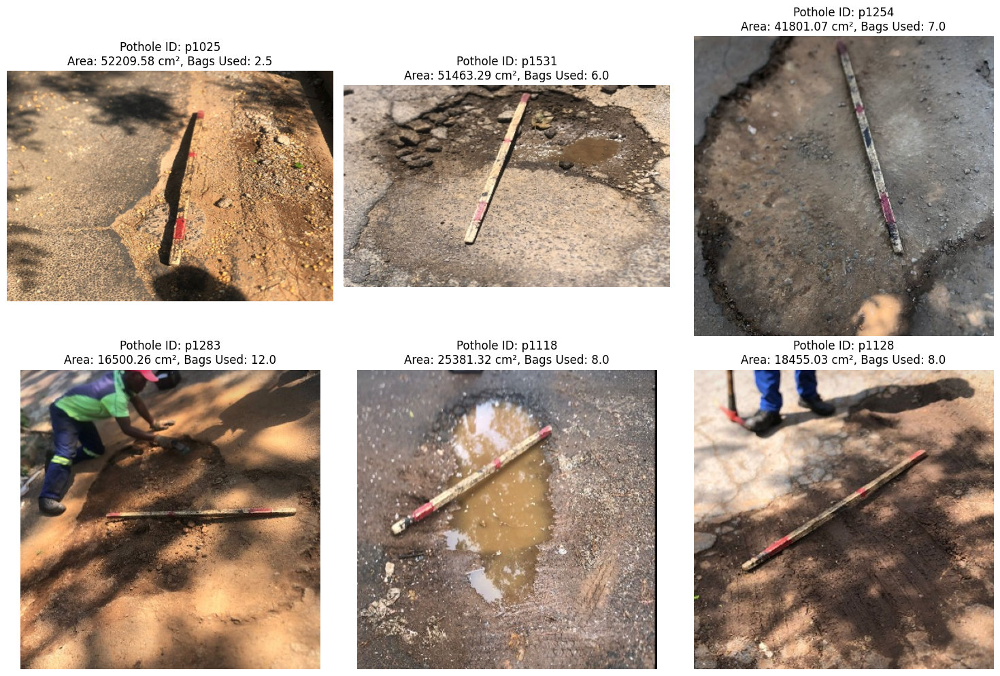

In [409]:
import cv2
import matplotlib.pyplot as plt

# Plot the sketchiest observations
sketchiest = outliers.head(6)  # Select the top 6 sketchiest observations

# Initialize a plot
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

for i, row in enumerate(sketchiest.itertuples(), 1):
    # Load the image
    image_path = os.path.join('Combined Data/train_images', f"{row.pothole_id}.jpg")
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    
    # Plot the image with annotations in a 2x3 grid
    plt.subplot(2, 3, i)  # 2 rows, 3 columns
    plt.imshow(image)
    plt.title(f"Pothole ID: {row.pothole_id}\nArea: {row.pothole_area_mm2 / 100:.2f} cm², Bags Used: {row.bags_used}")
    plt.axis('off')

# Show the plot with all images in a 2x3 grid
plt.tight_layout()
plt.show()

### Using Bags to Area Ratio

In [375]:
import pandas as pd

# Create a separate DataFrame with the necessary calculations
scaled_df = train_df[['pothole_id', 'pothole_area_mm2', 'bags_used']].copy()
scaled_df['bags_per_cm2'] = scaled_df['bags_used'] / (scaled_df['pothole_area_mm2']/100)  # Convert area to cm²

In [376]:
from sklearn.preprocessing import StandardScaler

# Standardize the bags_per_cm2 feature
scaler = StandardScaler()
scaled_features = scaler.fit_transform(scaled_df[['bags_per_cm2']])

In [377]:
from sklearn.ensemble import IsolationForest

# Apply Isolation Forest on the standardized ratio
iso_forest = IsolationForest(contamination=0.05, random_state=42)
anomaly_scores = iso_forest.fit_predict(scaled_features)

In [378]:
scaled_df['anomaly_score'] = anomaly_scores

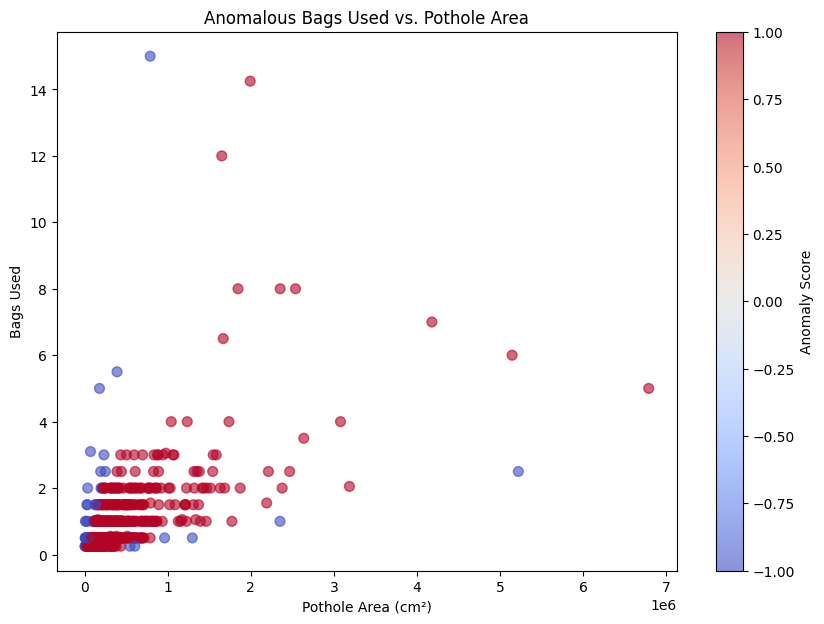

In [379]:
import matplotlib.pyplot as plt

# Plot the bags used against the area for all observations
plt.figure(figsize=(10, 7))
plt.scatter(scaled_df['pothole_area_mm2'], scaled_df['bags_used'], c=scaled_df['anomaly_score'], cmap='coolwarm', alpha=0.6, s=50)
plt.colorbar(label='Anomaly Score')
plt.xlabel('Pothole Area (cm²)')
plt.ylabel('Bags Used')
plt.title('Anomalous Bags Used vs. Pothole Area')
plt.show()

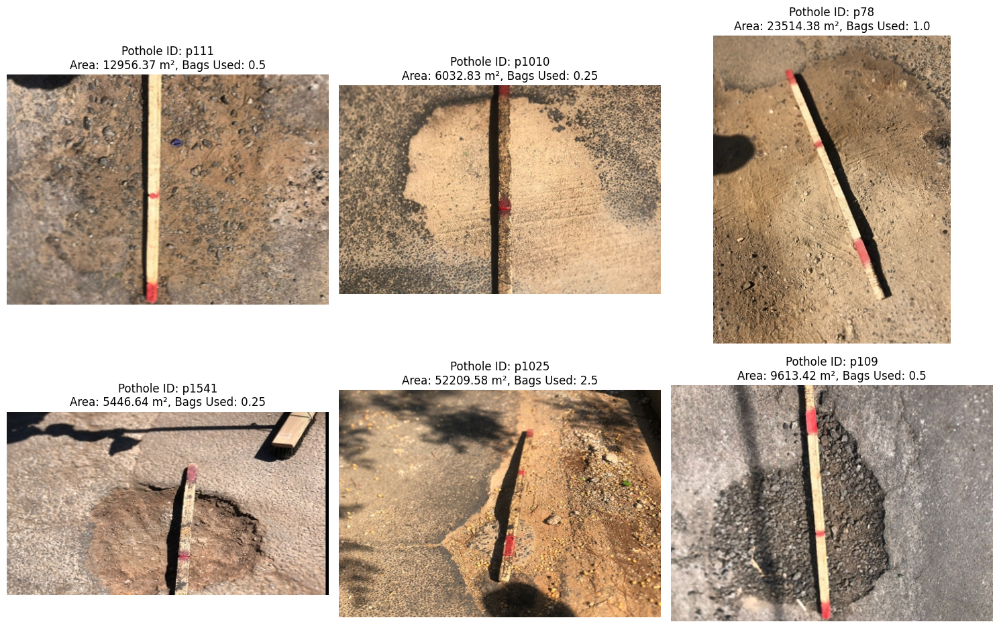

In [383]:
import cv2
import matplotlib.pyplot as plt

# Select the top 6 sketchiest findings with the highest bags_per_cm2 ratio
sketchiest_high_ratio = scaled_df[scaled_df['anomaly_score'] == -1].sort_values(by='bags_per_cm2', ascending=True).head(6)

# Initialize a plot with two rows
plt.figure(figsize=(15, 10))

for i, row in enumerate(sketchiest_high_ratio.itertuples(), 1):
    # Load the image
    image_path = os.path.join('Combined Data/train_images', f"{row.pothole_id}.jpg")
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    
    # Plot the image with annotations
    plt.subplot(2, 3, i)  # 2 rows, 3 columns
    plt.imshow(image)
    plt.title(f"Pothole ID: {row.pothole_id}\nArea: {row.pothole_area_mm2 / 100:.2f} m², Bags Used: {row.bags_used}")
    plt.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

## Removing Noise

In [116]:
features = train_df.drop(['pothole_id', 'bags_used'], axis=1).columns
scaler = StandardScaler()
train_df[features] = scaler.fit_transform(train_df[features])

# Bin the 'bags_used' column
bins = [train_df['bags_used'].min(), 0.5, 1, 2, 3, train_df['bags_used'].max()]
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
train_df['bags_used_binned'] = pd.cut(train_df['bags_used'], bins=bins, labels=labels, include_lowest=True)

# Remove outliers in `bags_used` based on IQR
Q1 = train_df['bags_used'].quantile(0.25)
Q3 = train_df['bags_used'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR
filtered_df = train_df[(train_df['bags_used'] >= lower_bound) & (train_df['bags_used'] <= upper_bound)]
filtered_df = filtered_df.reset_index(drop=True)

# Prepare data for Tomek Links removal
X_filtered = filtered_df.drop(columns=['pothole_id', 'bags_used', 'bags_used_binned'])
y_filtered = filtered_df['bags_used_binned'].astype('category').cat.codes  # Convert to categorical codes

# Scale the features
X_filtered_scaled = scaler.fit_transform(X_filtered)

# Apply Tomek Links
tl = TomekLinks(sampling_strategy='auto')
X_resampled_filtered, y_resampled_filtered = tl.fit_resample(X_filtered_scaled, y_filtered)

# Get the indices of the remaining samples
resampled_indices_filtered = tl.sample_indices_

# Identify the removed indices
removed_indices_filtered = np.setdiff1d(np.arange(X_filtered.shape[0]), resampled_indices_filtered)

# Get the pothole IDs of the removed samples
removed_pothole_ids_filtered = filtered_df.iloc[removed_indices_filtered]['pothole_id'].tolist()

# Keep only the non-Tomek Link samples
cleaned_filtered_df = filtered_df.iloc[resampled_indices_filtered]

# Display the pothole IDs that were removed
print("Removed Pothole IDs after Tomek Links:", removed_pothole_ids_filtered)

Removed Pothole IDs after Tomek Links: ['p1234', 'p1591', 'p985', 'p991', 'p990', 'p416', 'p1551', 'p1586', 'p992', 'p986', 'p39', 'p38', 'p1626', 'p978', 'p1356', 'p1593', 'p1587', 'p1544', 'p1020', 'p1018', 'p149', 'p983', 'p968', 'p1636', 'p1623', 'p969', 'p1596', 'p1582', 'p1019', 'p1033', 'p1580', 'p1609', 'p1190', 'p1620', 'p1542', 'p413', 'p448', 'p1323', 'p266', 'p500', 'p298', 'p267', 'p1652', 'p139', 'p1242', 'p1083', 'p258', 'p1651', 'p1533', 'p300', 'p314', 'p1090', 'p1443', 'p1655', 'p63', 'p1682', 'p1683', 'p62', 'p115', 'p263', 'p48', 'p1642', 'p1656', 'p61', 'p1643', 'p1284', 'p1051', 'p316', 'p1074', 'p441', 'p1538', 'p44', 'p1672', 'p50', 'p78', 'p284', 'p1129', 'p1667', 'p440', 'p53', 'p1659', 'p84', 'p1658', 'p251', 'p331', 'p447', 'p1072', 'p1516', 'p1304', 'p42', 'p446', 'p478', 'p120', 'p1663', 'p83', 'p1676', 'p1104', 'p1306', 'p109', 'p350', 'p422', 'p1201', 'p1567', 'p146', 'p1639', 'p999', 'p147', 'p1570', 'p145', 'p970', 'p346', 'p1001', 'p342', 'p418', 'p10

/var/folders/cn/l2w87hs522x2cpq6dw6dslqh0000gn/T/ipykernel_5918/2747045469.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_filtered_df['pca_component_1'] = X_pca_cleaned_filtered[:, 0]
/var/folders/cn/l2w87hs522x2cpq6dw6dslqh0000gn/T/ipykernel_5918/2747045469.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_filtered_df['pca_component_2'] = X_pca_cleaned_filtered[:, 1]


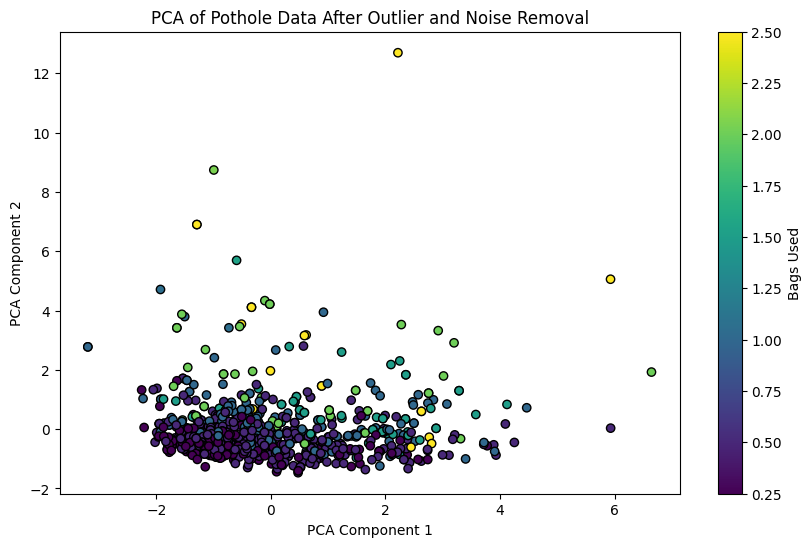

In [58]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Perform PCA on the cleaned data
X_cleaned_filtered = cleaned_filtered_df.drop(columns=['pothole_id', 'bags_used', 'bags_used_binned'])
X_cleaned_filtered_scaled = scaler.transform(X_cleaned_filtered)  # Scale the data using the same scaler
pca = PCA(n_components=2)
X_pca_cleaned_filtered = pca.fit_transform(X_cleaned_filtered_scaled)

# Add PCA components to the cleaned dataframe
cleaned_filtered_df['pca_component_1'] = X_pca_cleaned_filtered[:, 0]
cleaned_filtered_df['pca_component_2'] = X_pca_cleaned_filtered[:, 1]

# Plot the cleaned data
plt.figure(figsize=(10, 6))
plt.scatter(cleaned_filtered_df['pca_component_1'], 
            cleaned_filtered_df['pca_component_2'], 
            c=cleaned_filtered_df['bags_used'], cmap='viridis', edgecolor='k')
plt.colorbar(label='Bags Used')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Pothole Data After Outlier and Noise Removal')
plt.show()

In [59]:
train_df.head(10)

,pothole_id,mm_to_pixel_ratio,pothole_length,pothole_width,pothole_area_mm2,bags_used,bags_used_binned
0,p1036,-0.316667,-0.461135,-0.927434,-0.478061,0.50,Very Low
1,p1022,-0.115352,2.147798,1.175321,2.409622,2.00,Medium
2,p417,0.377048,-0.247538,-0.658477,-0.053472,0.50,Very Low
3,p1552,-0.740804,0.728905,-0.181690,-0.309554,0.50,Very Low
4,p1234,1.670005,-0.517077,0.001690,0.805806,1.00,Low
5,p173,-0.743544,-0.644218,-0.346731,-0.541612,0.25,Very Low
6,p173,-0.743544,-0.644218,-0.346731,-0.541612,0.25,Very Low
7,p1208,-0.260860,-0.130568,-0.132788,-0.370864,0.50,Very Low
8,p167,-0.985950,0.103371,0.020028,-0.423637,0.50,Very Low
9,p167,-0.985950,0.103371,0.020028,-0.423637,0.50,Very Low


In [62]:
kept_potholes = cleaned_filtered_df['pothole_id']

In [66]:
kept_potholes.to_csv('Combined Data/kept_pothole_ids.csv', index=False)

In [68]:
test_df = pd.read_csv('Combined Data/test_df.csv')
train_df = pd.read_csv('Combined Data/train_df.csv')

In [70]:
train_df_subset = train_df[train_df['pothole_id'].isin(kept_potholes)]

## KNN Regressor

In [164]:
from sklearn.neighbors import KNeighborsRegressor

In [79]:
X_train = train_df_subset.drop(['pothole_id','bags_used'], axis=1)
y_train = train_df_subset['bags_used']

X_test = test_df.drop('pothole_id', axis=1)

In [80]:
X_train.head(3)

,mm_to_pixel_ratio,pothole_length,pothole_width,pothole_area_mm2
0,2.024225,256,174,1.143629e+05
1,2.233278,769,518,1.685416e+06
2,2.744603,298,218,3.453620e+05


In [81]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [84]:
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

### Cross Val

In [162]:
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.metrics import r2_score, make_scorer

In [104]:
knn_model = KNeighborsRegressor(n_neighbors=10)
r2_scorer = make_scorer(r2_score)
kf = KFold(n_splits=12, shuffle=True, random_state=42)

In [105]:
cv_r2_scores = cross_val_score(knn_model, X_pca, y_train, cv=kf, scoring=r2_scorer)

In [106]:
print("R² scores for each fold:", cv_r2_scores)
print("Mean R² score:", cv_r2_scores.mean())

R² scores for each fold: [0.51295968 0.40338257 0.36831431 0.52562091 0.49246287 0.31362415
 0.35091909 0.33247459 0.28825521 0.63020971 0.45656802 0.55275588]
Mean R² score: 0.43562891539366083


In [108]:
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_pca, y_train)

KNeighborsRegressor()

In [109]:
y_pred = knn_model.predict(X_test_pca)

In [110]:
pred_df = pd.DataFrame({
    'Pothole number': test_df['pothole_id'],
    'Bags used ': y_pred
})

# Display the first few rows of pred_df
pred_df.head(30)

,Pothole number,Bags used
0,p1181,0.50
1,p1430,0.45
2,p1409,0.65
3,p406,1.51
4,p104,0.90
5,p1280,0.40
6,p1134,0.25
7,p105,1.00
8,p1040,0.60
9,p1296,0.45


In [111]:
pred_df['Pothole number'] = pred_df['Pothole number'].str.replace("p","").astype(int)
pred_df = pred_df.sort_values('Pothole number')

In [112]:
pred_df.set_index('Pothole number', inplace=True)

In [113]:
pred_df.to_csv('../../data/predictions/KNeighbours.csv')

In [54]:
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import random

# Custom R² metric function
def r2_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    SS_res = tf.reduce_sum(tf.square(y_true - y_pred))
    SS_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))
    return 1 - SS_res / (SS_tot + tf.keras.backend.epsilon())

# Load the trained model
model_path = 'models/bags_used_predictor_final.keras'
model = tf.keras.models.load_model(model_path, custom_objects={'r2_metric': r2_metric})
model.summary()

# Load the data
train_df = pd.read_csv('Combined Data/contrastive_learning_labels.csv')

# Scale the scalar features
scaler = StandardScaler()
train_df[['pothole_area_mm2', 'mm_to_pixel_ratio']] = scaler.fit_transform(train_df[['pothole_area_mm2', 'mm_to_pixel_ratio']])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ image_input[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ scalar_input        │ (None, 2)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 1282)      │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ scalar_input[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │    164,224 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128)       │        512 │ dense_3[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      8,256 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_4[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 64)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 1)         │         65 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 7,224,901 (27.56 MB)

 Trainable params: 2,396,801 (9.14 MB)

 Non-trainable params: 34,496 (134.75 KB)

 Optimizer params: 4,793,604 (18.29 MB)

In [110]:
random_row = train_df.sample(n=1).iloc[0]
pothole_id = random_row['pothole_id']
true_bags_used = random_row['bags_used']

# Load and preprocess the image
image_path = f'Combined Data/contrastive_learning_images/{pothole_id}.jpg'

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize to [0, 1]
    return img_array

image = preprocess_image(image_path)

# Prepare the scalar features
scalar_features = np.array([[random_row['pothole_area_mm2'], random_row['mm_to_pixel_ratio']]])

# Make the prediction
predicted_bags_used = model({'image_input': image, 'scalar_input': scalar_features})

# Display the results
print(f"Pothole ID: {pothole_id}")
print(f"True Bags Used: {true_bags_used}")
print(f"Predicted Bags Used: {predicted_bags_used[0][0]}")

Pothole ID: p347
True Bags Used: 1.5
Predicted Bags Used: 1.415789246559143


In [111]:
from sklearn.metrics import r2_score

# Initialize lists to store true and predicted values
true_values = []
predicted_values = []

# Loop through each row in the training DataFrame
for index, row in train_df.iterrows():
    pothole_id = row['pothole_id']
    true_bags_used = row['bags_used']
    
    # Load and preprocess the image
    image_path = f'Combined Data/contrastive_learning_images/{pothole_id}.jpg'
    image = preprocess_image(image_path)

    # Prepare the scalar features
    scalar_features = np.array([[row['pothole_area_mm2'], row['mm_to_pixel_ratio']]])

    # Make the prediction
    predicted_bags_used = model({'image_input': image, 'scalar_input': scalar_features})

    # Store the true and predicted values
    true_values.append(true_bags_used)
    predicted_values.append(predicted_bags_used[0][0])

# Calculate the R² score
r2 = r2_score(true_values, predicted_values)
print(f"R² Score on Training Set: {r2}")

R² Score on Training Set: 0.41807744479187803


In [120]:
test_df = pd.read_csv('Combined Data/test_df.csv')

pothole_ids = []
y_pred = []

# Loop through each row in the validation DataFrame (assuming val_df is your test dataset)
for index, row in test_df.iterrows():
    pothole_id = row['pothole_id']
    
    # Load and preprocess the image
    image_path = f'Combined Data/test_images/{pothole_id}.jpg'
    image = preprocess_image(image_path)

    scalar_features = np.array([[row['pothole_area_mm2'], row['mm_to_pixel_ratio']]])
    scalar_features_scaled = scaler.transform(scalar_features)

    # Make the prediction
    predicted_bags_used = model({'image_input': image, 'scalar_input': scalar_features_scaled})

    # Store the pothole_id and predicted value
    pothole_ids.append(pothole_id)
    y_pred.append(predicted_bags_used[0][0])

y_pred_values = [pred.numpy() for pred in y_pred]
# Create a DataFrame to store the results
predictions_df = pd.DataFrame({
    'pothole_id': pothole_ids,
    'predicted_bags_used': y_pred_values
})

print("Predictions have been stored in y_pred with corresponding pothole_id.")

/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature nam

Predictions have been stored in y_pred with corresponding pothole_id.


/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [123]:
predictions_df

,pothole_id,predicted_bags_used
0,p1181,0.046068
1,p1430,0.000000
2,p1409,0.000000
3,p406,1.767032
4,p104,0.000000
5,p1280,0.000000
6,p1134,0.000000
7,p105,0.576704
8,p1040,0.258225
9,p1296,0.000000


# Creating Pothole Cutouts for Modelling

### Filtering out faulty potholes

In [177]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from ultralytics import YOLO

def create_pothole_cutout_images(images_dir, output_dir, segmentation_model, dilation_iterations=10):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    last_images = []  # To store the last 4 images for plotting

    # Iterate through all images in the directory
    for image_name in tqdm(os.listdir(images_dir)):
        image_path = os.path.join(images_dir, image_name)

        # Load the image
        image = cv2.imread(image_path)

        # Predict the pothole contour using the segmentation model
        contour_results = segmentation_model.predict(source=image, conf=0.001, save=False, verbose=False)

        if contour_results[0].masks is not None:
            masks = contour_results[0].masks.data.cpu().numpy()
            mask_scores = contour_results[0].boxes.conf.cpu().numpy()
            max_conf_idx = np.argmax(mask_scores)
            best_mask = masks[max_conf_idx]

            # Apply threshold to mask
            mask = (best_mask > 0.5).astype(np.uint8) * 255

            # Resize mask to fit original image scale
            mask_resized = cv2.resize(mask, (image.shape[1], image.shape[0]))

            # Dilate the mask to make the contour significantly bigger
            kernel = np.ones((5, 5), np.uint8)
            mask_dilated = cv2.dilate(mask_resized, kernel, iterations=dilation_iterations)

            # Create a blank black image
            black_image = np.zeros_like(image)

            # Apply the dilated mask to the black image, leaving only the pothole visible
            pothole_cutout = cv2.bitwise_and(image, image, mask=mask_dilated)

            # Save the resulting image
            output_path = os.path.join(output_dir, image_name)
            cv2.imwrite(output_path, pothole_cutout)

            # Store the image for plotting if it's one of the last four
            if len(last_images) < 4:
                last_images.append(pothole_cutout)

        else:
            print(f"No pothole contour detected in {image_name}.")

    # Plot the last 4 images
    for i, img in enumerate(last_images):
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Last Image {i+1}")
        plt.show()

# Load the segmentation model
segmentation_model = YOLO('../pandas/Christiaan/YOLO/Segmentation/best.pt')

# Define the directories
images_dir = 'Combined Data/valid_images'
output_dir = 'Combined Data/contour_cutouts'

# Create pothole cutout images with a larger outline
create_pothole_cutout_images(images_dir, output_dir, segmentation_model, dilation_iterations=2)

  3%|█                                         | 22/874 [00:02<01:36,  8.80it/s]


KeyboardInterrupt: 

In [131]:
train_df.shape

(874, 7)

100%|█████████████████████████████████████████| 843/843 [01:25<00:00,  9.85it/s]


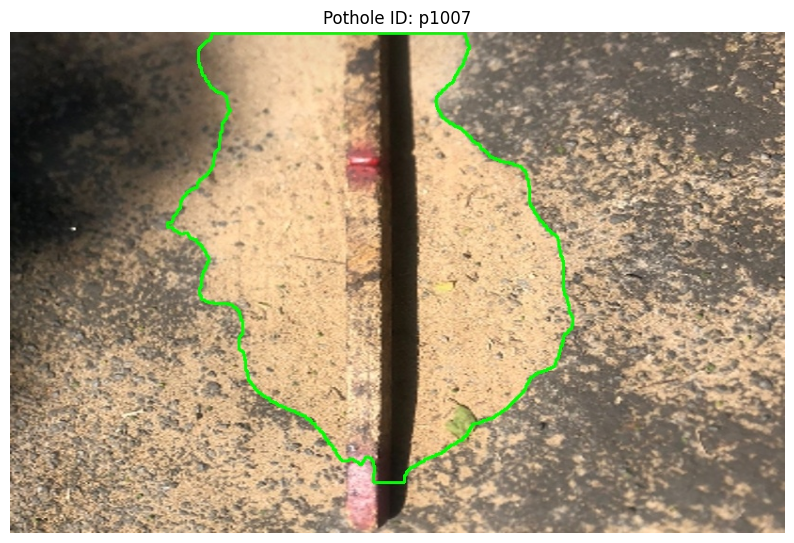

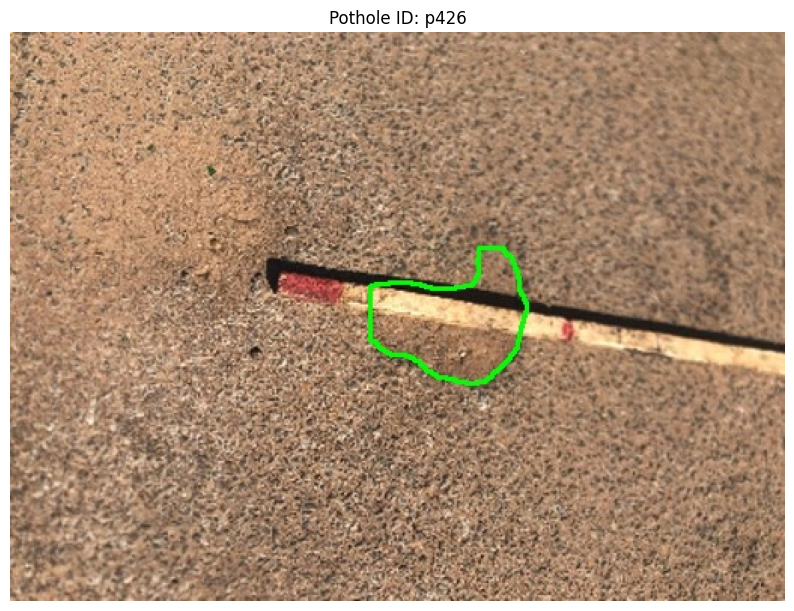

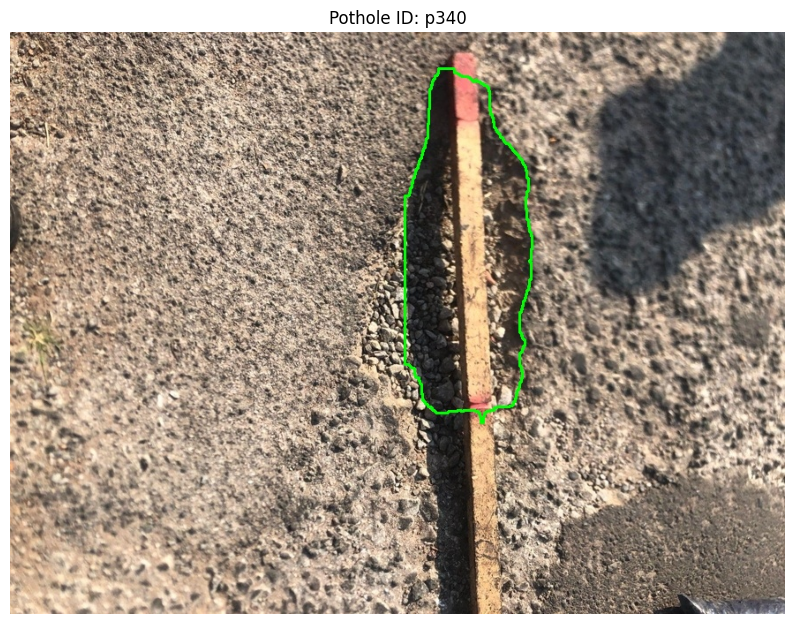

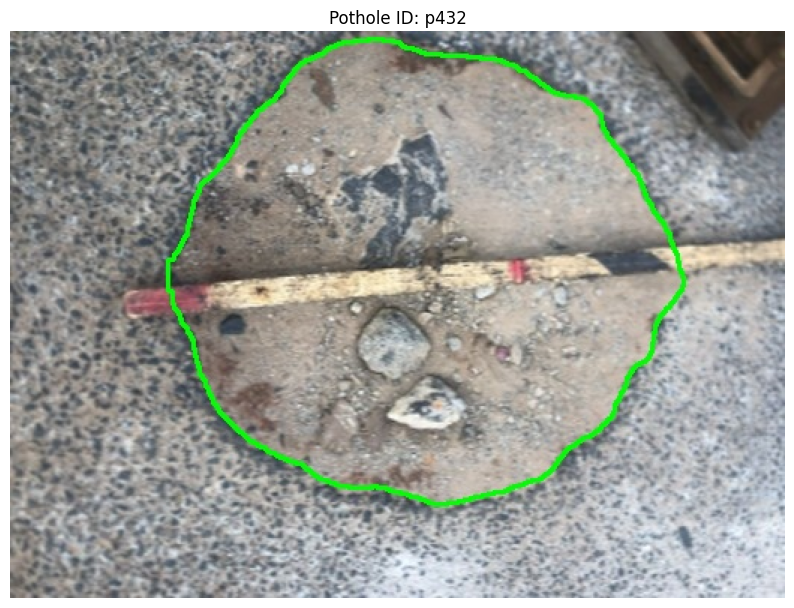

In [136]:
contour_cutouts_dir = 'Combined Data/contour_cutouts'
valid_images_dir = 'Combined Data/valid_images'
output_dir = 'Combined Data/pothole_outlines'

# Step 1: Create a DataFrame with all pothole_ids in contour_cutouts directory
pothole_ids = [os.path.splitext(filename)[0] for filename in os.listdir(contour_cutouts_dir)]
pothole_df = pd.DataFrame({'pothole_id': pothole_ids})

# Save the DataFrame
pothole_df.to_csv('pothole_ids.csv', index=False)

# Load the segmentation model
segmentation_model = YOLO('../pandas/Christiaan/YOLO/Segmentation/best.pt')

# Ensure the output directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Go through valid_images and draw green contour lines on the images present in the DataFrame
for pothole_id in tqdm(pothole_df['pothole_id']):
    image_path = os.path.join(valid_images_dir, f"{pothole_id}.jpg")
    if os.path.exists(image_path):
        # Load the image
        image = cv2.imread(image_path)

        # Predict the pothole contour using the segmentation model
        contour_results = segmentation_model.predict(source=image, conf=0.001, save=False, verbose=False)

        if contour_results[0].masks is not None:
            masks = contour_results[0].masks.data.cpu().numpy()
            mask_scores = contour_results[0].boxes.conf.cpu().numpy()
            max_conf_idx = np.argmax(mask_scores)
            best_mask = masks[max_conf_idx]

            # Apply threshold to mask
            mask = (best_mask > 0.5).astype(np.uint8) * 255

            # Resize mask to fit original image scale
            mask_resized = cv2.resize(mask, (image.shape[1], image.shape[0]))

            # Find contours in the mask
            contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # Draw the contours on the original image in green
            cv2.drawContours(image, contours, -1, (0, 255, 0), 2)  # Green contours

            # Save the resulting image
            output_path = os.path.join(output_dir, f"{pothole_id}.jpg")
            cv2.imwrite(output_path, image)
        else:
            print(f"No pothole contour detected in {pothole_id}.jpg")

# Optional: Display the last few processed images
for i, pothole_id in enumerate(pothole_df['pothole_id'][-4:]):
    image_path = os.path.join(output_dir, f"{pothole_id}.jpg")
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f"Pothole ID: {pothole_id}")
        plt.show()

In [150]:
import os
import pandas as pd

# Define the directory and the CSV path
pothole_outlines_dir = 'Combined Data/pothole_outlines'
csv_path = 'Combined Data/valid_contour_ids_1.csv'

# Get the list of existing pothole_ids in the pothole_outlines directory
updated_pothole_ids = [os.path.splitext(filename)[0] for filename in os.listdir(pothole_outlines_dir)]

# Load the original CSV
pothole_df = pd.read_csv(csv_path)

# Filter the DataFrame to keep only the rows corresponding to the updated_pothole_ids
updated_pothole_df = pothole_df[pothole_df['pothole_id'].isin(updated_pothole_ids)].reset_index(drop=True)

# Save the updated DataFrame back to CSV
updated_pothole_df.to_csv(csv_path, index=False)

print(f"Updated CSV saved with {len(updated_pothole_df)} pothole IDs.")

Updated CSV saved with 543 pothole IDs.


In [257]:
train_df = pd.read_csv('Combined Data/train_df_more.csv').drop_duplicates()
test_df = pd.read_csv('Combined Data/test_df_more.csv')

In [258]:
train_df = train_df[(train_df['pothole_id'].isin(updated_pothole_ids)) & (train_df['bags_used']<4)]

In [259]:
train_df.shape

(537, 9)

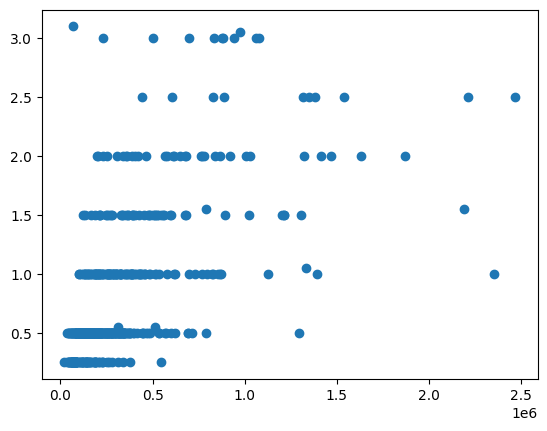

In [260]:
plt.scatter(train_df['pothole_area_mm2'],train_df['bags_used'])

/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/christiaanhildebrand/anaconda3/envs/Main/lib/python3.11/site-packages/seaborn/_oldcore.py:111

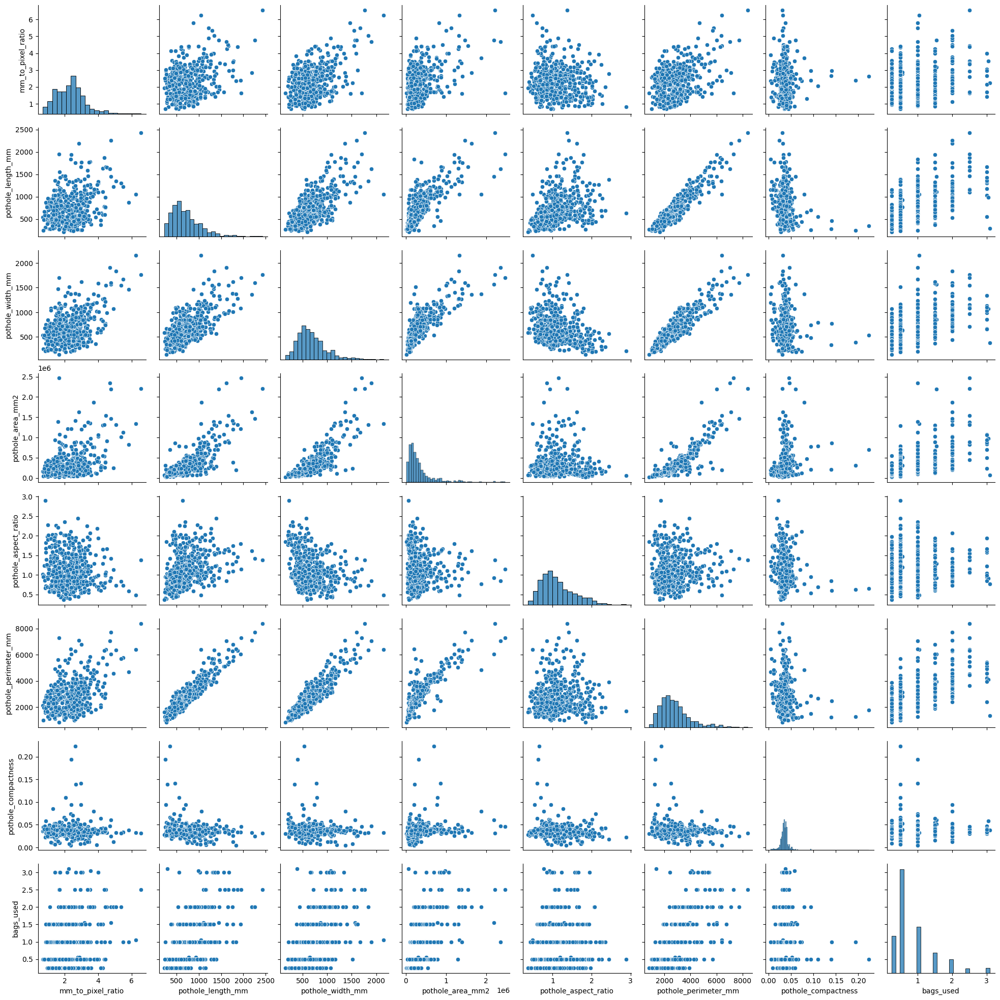

In [ ]:
sns.pairplot(train_df)

In [262]:
X_train = train_df.drop(['pothole_id', 'bags_used'], axis=1)
y_train = train_df['bags_used']
X_test = test_df.drop('pothole_id', axis=1)

In [263]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [292]:
knn_model = KNeighborsRegressor(n_neighbors=20)
r2_scorer = make_scorer(r2_score)
kf = KFold(n_splits=12, shuffle=True, random_state=1)

In [293]:
cv_r2_scores = cross_val_score(knn_model, X_train_scaled, y_train, cv=kf, scoring=r2_scorer)

In [294]:
print("R² scores for each fold:", cv_r2_scores)
print("Mean R² score:", cv_r2_scores.mean())

R² scores for each fold: [    0.10788     0.22807     0.37665     0.46954       0.503     0.57562     0.26339     0.44793     0.39256     0.37522     0.53868     0.32574]
Mean R² score: 0.38368902129086796


In [295]:
knn_model.fit(X_train_scaled, y_train)

KNeighborsRegressor(n_neighbors=20)

In [296]:
y_pred = knn_model.predict(X_test_scaled)

In [297]:
pred_df = pd.DataFrame({
    'Pothole number': test_df['pothole_id'],
    'Bags used ': y_pred
})

# Display the first few rows of pred_df
pred_df.head(30)

,Pothole number,Bags used
0,p1181,0.6125
1,p1430,0.7125
2,p1409,0.5050
3,p406,1.7525
4,p104,0.6625
5,p1280,0.5500
6,p1134,0.3625
7,p105,0.6775
8,p1040,0.5375
9,p1296,0.4625


In [298]:
pred_df['Pothole number'] = pred_df['Pothole number'].str.replace("p","").astype(int)
pred_df = pred_df.sort_values('Pothole number')

In [299]:
pred_df.set_index('Pothole number', inplace=True)

In [300]:
pred_df.head(30)

,Bags used
Pothole number,
103,0.7650
104,0.6625
105,0.6775
108,0.7625
114,1.8775
143,0.5000
144,0.9375
406,1.7525
434,1.2250


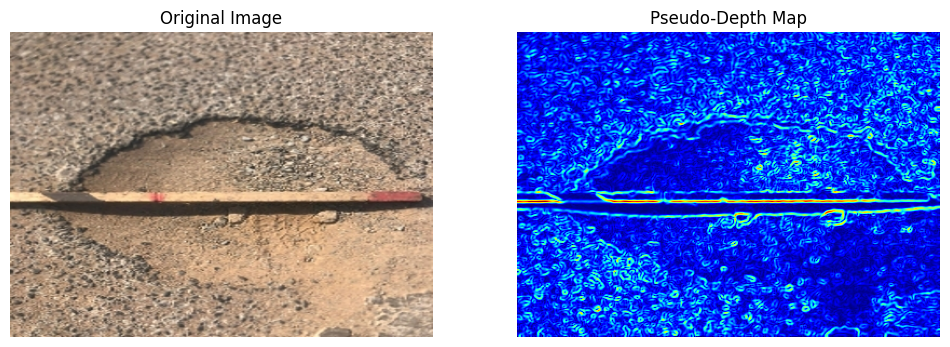

In [ ]:
import torch
import cv2
import numpy as np
from torchvision import transforms
from PIL import Image

def create_depth_map_midas(image_path):
    # Load the MiDaS model
    model = torch.hub.load("intel-isl/MiDaS", "MiDaS")
    model.eval()

    # Load the image and preprocess it
    transform = transforms.Compose([
        transforms.Resize((384, 384)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path)  # Use PIL to open the image
    input_tensor = transform(image).unsqueeze(0)

    # Run the model to get depth prediction
    with torch.no_grad():
        depth_map = model(input_tensor).squeeze().numpy()

    # Normalize depth map to 8-bit
    depth_map = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
    depth_map = np.uint8(depth_map)

    return depth_map

def create_depth_map_log(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Apply GaussianBlur to smooth the image
    blurred_image = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Apply Laplacian filter to detect edges
    depth_map = cv2.Laplacian(blurred_image, cv2.CV_64F)
    
    # Normalize the depth map to the range [0, 255]
    depth_map = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
    depth_map = np.uint8(depth_map)

    return depth_map

def create_depth_map_hist_eq(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)

    # Apply Sobel filter to highlight edges (similar to gradient method)
    grad_x = cv2.Sobel(equalized_image, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(equalized_image, cv2.CV_64F, 0, 1, ksize=5)

    depth_map = cv2.magnitude(grad_x, grad_y)

    # Normalize the depth map to the range [0, 255]
    depth_map = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
    depth_map = np.uint8(depth_map)

    return depth_map

def create_depth_map_msr(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Gaussian Blur at multiple scales
    scales = [3, 5, 9]
    retinex = np.zeros_like(image, dtype=np.float64)
    for scale in scales:
        blur = cv2.GaussianBlur(image, (scale, scale), 0)
        retinex += np.log1p(image) - np.log1p(blur)

    retinex /= len(scales)

    # Normalize and scale to 8-bit
    depth_map = cv2.normalize(retinex, None, 0, 255, cv2.NORM_MINMAX)
    depth_map = np.uint8(depth_map)

    return depth_map

def create_depth_map_sfd(image_path):
    # Load the pre-trained model from PyTorch hub
    model = torch.hub.load("intel-isl/MiDaS", "MiDaS")
    model.eval()

    # Load and preprocess the image
    transform = transforms.Compose([
        transforms.Resize((384, 384)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path)
    input_tensor = transform(image).unsqueeze(0)

    # Run the model to get depth prediction
    with torch.no_grad():
        depth_map = model(input_tensor).squeeze().numpy()

    # Normalize depth map to 8-bit
    depth_map = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
    depth_map = np.uint8(depth_map)

    return depth_map

# Example usage
image_path = 'Combined Data/train_images/p250.jpg'  # Replace with the path to your image
image = cv2.imread(image_path)
depth_map = create_depth_map(image_path)

# Convert image to RGB for display with matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot the original image and the depth map side by side
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(depth_map, cmap='jet')
plt.title('Pseudo-Depth Map')
plt.axis('off')

plt.show()